## 1. Setting up the environment

In [2]:
import numpy as np
import gym

#pytorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.distributions import Normal
# setting manual seed
torch.manual_seed(0)

from parallelEnv import parallelEnv

#matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# imports for rendering outputs in Jupyter.
from JSAnimation.IPython_display import display_animation
from matplotlib import animation
from IPython.display import display

In [5]:
# lets set up the cartpole environment
env = gym.make('Ant-v2')
env.seed(0)

# lets find about the action and state space
print("Action space: {} ... State space: {}".format(env.action_space,env.observation_space))

# lets print some info about action space range
action_high = env.action_space.high
action_low = env.action_space.low
print("action_high: {}\t action_low: {}".format(action_high,action_low))

Action space: Box(8,) ... State space: Box(111,)
action_high: [1. 1. 1. 1. 1. 1. 1. 1.]	 action_low: [-1. -1. -1. -1. -1. -1. -1. -1.]


In [6]:
# lets play a random episode

# reset env
state = env.reset()
step_count = 0
done = False

while (not done):
    # random action
    action = env.action_space.sample()
    # taking step in env
    next_state,reward,done,_ = env.step(action)
    
    # displaying progress
    print ("Step : {} ... state: {} ... action: {} ... reward: {} ... done: {}".format(step_count,
                                                                                       state,action,reward,done))
    
    # updating state and step count
    state = next_state
    step_count+=1

Step : 0 ... state: [ 0.77653819  0.99568036 -0.08262989  0.03597664 -0.02232961  0.03396921
 -0.08803221  0.00539745 -0.09194186  0.09558882 -0.00741265  0.02592959
  0.08940969 -0.04298223  0.18408469 -0.00426755 -0.02830968  0.0768657
  0.04120936  0.06595625  0.07713414  0.00192143 -0.1007089  -0.08684192
 -0.11206329  0.02211159 -0.20847065  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0

## 2. Defining the policy

In [12]:
# defining the device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print ("using",device)

using cuda:0


In [13]:
state_size = env.observation_space.shape[0]
action_size = env.action_space.shape[0]

# define actor critic network
class ActorCritic(nn.Module):
    
    def __init__(self,state_size,action_size,action_high,action_low,hidden_size=32):
        super(ActorCritic, self).__init__()
        
        # action range
        self.action_high = torch.tensor(action_high).to(device)
        self.action_low = torch.tensor(action_low).to(device)
        
        self.std = nn.Parameter(torch.zeros(action_size))
        
        # common network
        self.fc1 = nn.Linear(state_size,512)
        
        # actor network
        self.fc2_actor = nn.Linear(512,256)
        self.fc3_action = nn.Linear(256,action_size)
        #self.fc3_std = nn.Linear(64,action_size)
        
        # critic network
        self.fc2_critic = nn.Linear(512,64)
        self.fc3_critic = nn.Linear(64,1)
    
    def forward(self,state):
        # common network
        x = F.relu(self.fc1(state))
        
        # actor network
        x_actor = F.relu(self.fc2_actor(x))
        action_mean = F.sigmoid(self.fc3_action(x_actor))
        ## rescale action mean
        action_mean_ = (self.action_high-self.action_low)*action_mean + self.action_low
        #action_std = F.sigmoid(self.fc3_std(x_actor))
        
        # critic network
        x_critic = F.relu(self.fc2_critic(x))
        v = self.fc3_critic(x_critic)
        return action_mean_,v
    
    def act(self,state,action=None):
        # converting state from numpy array to pytorch tensor on the "device"
        state = torch.from_numpy(state).float().to(device)
        action_mean,v = self.forward(state)
        prob_dist = Normal(action_mean,F.softplus(self.std))
        if action is None:
            action = prob_dist.sample()
        log_prob = prob_dist.log_prob(action).sum(-1).unsqueeze(-1)
        entropy = prob_dist.entropy().sum(-1).unsqueeze(-1)
        return {'a': action,
                'log_pi_a': log_prob,
                'ent': entropy,
                'mean': action_mean,
                'v': v}

## Storage class

In [14]:
class Storage:
    def __init__(self, size, keys=None):
        if keys is None:
            keys = []
        keys = keys + ['s', 'a', 'r', 'm',
                       'v', 'q', 'pi', 'log_pi', 'ent',
                       'adv', 'ret', 'q_a', 'log_pi_a',
                       'mean']
        self.keys = keys
        self.size = size
        self.reset()

    def add(self, data):
        for k, v in data.items():
            assert k in self.keys
            getattr(self, k).append(v)

    def placeholder(self):
        for k in self.keys:
            v = getattr(self, k)
            if len(v) == 0:
                setattr(self, k, [None] * self.size)

    def reset(self):
        for key in self.keys:
            setattr(self, key, [])

    def cat(self, keys):
        data = [getattr(self, k)[:self.size] for k in keys]
        return map(lambda x: torch.cat(x, dim=0), data)

## 3. Defining the RL agent

In [18]:
from collections import deque
from itertools import accumulate
import torch.tensor as tensor

def random_sample(indices, batch_size):
    indices = np.asarray(np.random.permutation(indices))
    batches = indices[:len(indices) // batch_size * batch_size].reshape(-1, batch_size)
    for batch in batches:
        yield batch
    r = len(indices) % batch_size
    if r:
        yield indices[-r:]
        
class Agent:
    
    def __init__(self,env_name,learning_rate=1e-3):
        self.env = parallelEnv(env_name=env_name,n=1,seed=0)
        nS = env.observation_space.shape[0]
        nA = env.action_space.shape[0]
        self.policy = ActorCritic(state_size=nS,hidden_size=128,action_size=nA,
                             action_low=action_low,action_high=action_high).to(device)
        self.optimizer = optim.RMSprop(self.policy.parameters(), lr=learning_rate)
        
        self.states = self.env.reset()
        self.episode_rewards_window = deque(maxlen=100)
        self.episode_rewards = []
        num_trajectories = 1
        self.online_rewards = np.zeros(num_trajectories)
    
        
    def train(self,max_opt_steps=1000,num_trajectories=1,rollout_length=2048,mini_batch_size=64,gamma=.99,
              target_score=-250,use_gae=False,gae_tau=0.95,PRINT_EVERY=100):
        
        for opt_step in range(max_opt_steps):
        
            storage = Storage(rollout_length)
            states = self.states
            for _ in range(rollout_length):
                prediction = self.policy.act(states)
                next_states, rewards, terminals, _ = self.env.step((prediction['a']).cpu().numpy())
                self.online_rewards += rewards
                for i, terminal in enumerate(terminals):
                    if terminals[i]:
                        self.episode_rewards.append(self.online_rewards[i])
                        self.episode_rewards_window.append(self.online_rewards[i])
                        self.online_rewards[i] = 0
                
                storage.add(prediction)
                storage.add({'r': tensor(rewards).unsqueeze(-1).float().to(device),
                             'm': tensor(1 - terminals).unsqueeze(-1).float().to(device),
                             's': tensor(states).to(device)})
                states = next_states

            self.states = states
            prediction = self.policy.act(states)
            storage.add(prediction)
            storage.placeholder()

            advantages = tensor(np.zeros((num_trajectories, 1)))
            returns = prediction['v'].detach()
            for i in reversed(range(rollout_length)):
                returns = storage.r[i] + gamma * storage.m[i] * returns
                if not use_gae:
                    advantages = returns - storage.v[i].detach()
                else:
                    td_error = storage.r[i] + gamma * storage.m[i] * storage.v[i + 1] - storage.v[i]
                    advantages = advantages * gae_tau * gamma * storage.m[i] + td_error
                storage.adv[i] = advantages.detach()
                storage.ret[i] = returns.detach()

            states, actions, log_probs_old, returns, advantages = storage.cat(['s', 'a', 'log_pi_a', 'ret', 'adv'])
            actions = actions.detach()
            log_probs_old = log_probs_old.detach()
            advantages = (advantages - advantages.mean()) / advantages.std()
            
            ppo_ratio_clip = 0.2
            gradient_clip = 0.5
            entropy_weight = 0.0
            
            for _ in range(10):
                sampler = random_sample(np.arange(states.size(0)), mini_batch_size)
                for batch_indices in sampler:
                    batch_indices = tensor(batch_indices).long()
                    sampled_states = states[batch_indices]
                    sampled_actions = actions[batch_indices]
                    sampled_log_probs_old = log_probs_old[batch_indices]
                    sampled_returns = returns[batch_indices]
                    sampled_advantages = advantages[batch_indices]

                    prediction = self.policy.act(sampled_states.cpu().numpy(), sampled_actions)
                    ratio = (prediction['log_pi_a'] - sampled_log_probs_old).exp()
                    obj = ratio * sampled_advantages
                    obj_clipped = ratio.clamp(1.0 - ppo_ratio_clip,
                                              1.0 + ppo_ratio_clip) * sampled_advantages
                    policy_loss = -torch.min(obj, obj_clipped).mean() - entropy_weight * prediction['ent'].mean()

                    value_loss = 0.5 * (sampled_returns - prediction['v']).pow(2).mean()

                    self.optimizer.zero_grad()
                    (policy_loss + value_loss).backward()
                    nn.utils.clip_grad_norm_(self.policy.parameters(), gradient_clip)
                    self.optimizer.step()
            
            #printing progress
            if opt_step % PRINT_EVERY == 0:
                print ("Opt step: {}\t Avg reward: {:.2f}\t std: {}".format(opt_step,np.mean(self.episode_rewards_window),
                                                                             self.policy.std))
                # save the policy
                torch.save(self.policy, 'REINFORCE-Ant.policy')
            
            if np.mean(self.episode_rewards_window)>= target_score:
                print ("Environment solved in {} optimization steps! ... Avg reward : {:.2f}".format(opt_step-100,
                                                                                          np.mean(self.episode_rewards_window)))
                # save the policy
                torch.save(self.policy, 'REINFORCE-Ant.policy')
                break
                
        return self.episode_rewards

## 4. Training the agent!

In [19]:
# lets define and train our agent
agent = Agent(env_name='Ant-v2',learning_rate=1e-4)

Process Process-3:
Traceback (most recent call last):
  File "/home/g1jaskiratsingh/anaconda3/envs/cv3/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/g1jaskiratsingh/anaconda3/envs/cv3/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/g1jaskiratsingh/learning/ppo/parallelEnv.py", line 104, in worker
    cmd, data = remote.recv()
  File "/home/g1jaskiratsingh/anaconda3/envs/cv3/lib/python3.6/multiprocessing/connection.py", line 250, in recv
    buf = self._recv_bytes()
  File "/home/g1jaskiratsingh/anaconda3/envs/cv3/lib/python3.6/multiprocessing/connection.py", line 407, in _recv_bytes
    buf = self._recv(4)
  File "/home/g1jaskiratsingh/anaconda3/envs/cv3/lib/python3.6/multiprocessing/connection.py", line 379, in _recv
    chunk = read(handle, remaining)
KeyboardInterrupt


In [20]:
scores = agent.train(max_opt_steps=20000,gamma=0.98,target_score=2000,PRINT_EVERY=100)

Opt step: 0	 Avg reward: -126.46	 std: Parameter containing:
tensor([-0.0103, -0.0044, -0.0015, -0.0066, -0.0050, -0.0065, -0.0056,  0.0052],
       device='cuda:0', requires_grad=True)


/home/g1jaskiratsingh/anaconda3/envs/cv3/lib/python3.6/site-packages/torch/serialization.py:250: UserWarning: Couldn't retrieve source code for container of type ActorCritic. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


Opt step: 100	 Avg reward: -27.66	 std: Parameter containing:
tensor([-0.5320, -0.5213, -0.5504, -0.4980, -0.4859, -0.4945, -0.5177, -0.5218],
       device='cuda:0', requires_grad=True)
Opt step: 200	 Avg reward: 203.97	 std: Parameter containing:
tensor([-0.9390, -0.9107, -1.0490, -0.8504, -0.8617, -0.8996, -0.9088, -0.9502],
       device='cuda:0', requires_grad=True)
Opt step: 300	 Avg reward: 425.56	 std: Parameter containing:
tensor([-1.2217, -1.2010, -1.3184, -1.1365, -1.1698, -1.2008, -1.2041, -1.3065],
       device='cuda:0', requires_grad=True)
Opt step: 400	 Avg reward: 671.44	 std: Parameter containing:
tensor([-1.4163, -1.4266, -1.5873, -1.3662, -1.3775, -1.4034, -1.4120, -1.5259],
       device='cuda:0', requires_grad=True)
Opt step: 500	 Avg reward: 759.87	 std: Parameter containing:
tensor([-1.4698, -1.6153, -1.7267, -1.5231, -1.5539, -1.5551, -1.5561, -1.7063],
       device='cuda:0', requires_grad=True)
Opt step: 600	 Avg reward: 777.14	 std: Parameter containing:
ten

KeyboardInterrupt: 

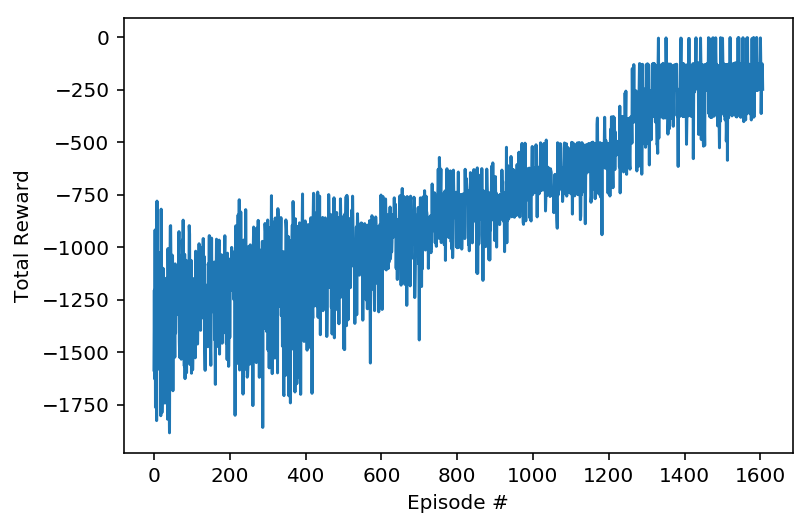

In [14]:
# plot reward curve over episodes
plt.figure()
plt.plot(scores)
plt.xlabel('Episode #')
plt.ylabel('Total Reward')
plt.show()

## 5. Watch the smart agent!

In [ ]:
# uncomment this cell to load the trained policy for Pendulum-v0
# load policy
policy =  torch.load('REINFORCE-Pendulum.policy',map_location='cpu')
agent = Agent(env_name='Pendulum-v0')
agent.policy = policy

In [21]:
# function to animate a list of frames
def animate_frames(frames):
    plt.figure(dpi = 72)
    plt.axis('off')

    # color option for plotting
    # use Greys for greyscale
    cmap = None if len(frames[0].shape)==3 else 'Greys'
    patch = plt.imshow(frames[0], cmap=cmap)  

    fanim = animation.FuncAnimation(plt.gcf(), \
        lambda x: patch.set_data(frames[x]), frames = len(frames), interval=30)
    
    display(display_animation(fanim, default_mode='once'))

In [22]:
def compute_future_rewards(rewards,gamma):
    future_rewards = np.zeros_like(rewards)
    discounted_rewards = np.zeros(rewards.shape[0])
    
    for time_step in range(future_rewards.shape[1]-1,-1,-1):
        future_rewards[:,time_step] = rewards[:,time_step] + gamma*discounted_rewards
        discounted_rewards = future_rewards[:,time_step]
    return future_rewards

/home/g1jaskiratsingh/anaconda3/envs/cv3/lib/python3.6/site-packages/torch/nn/functional.py:1332: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Total reward: 1462.8924179890776



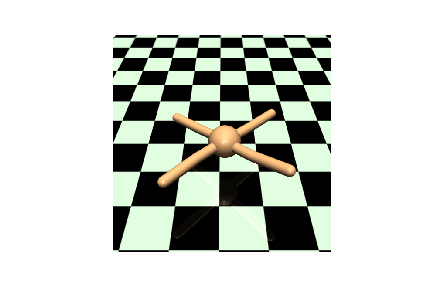
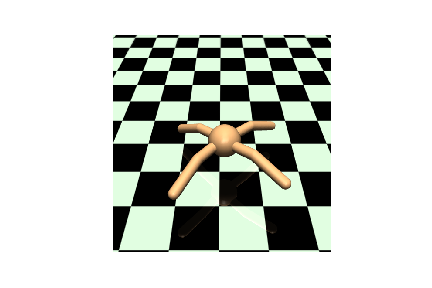
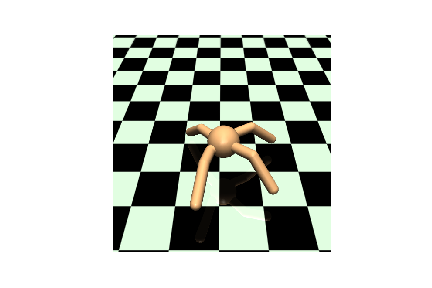
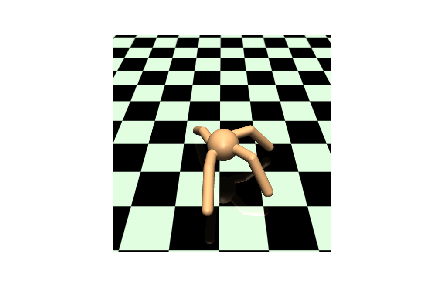
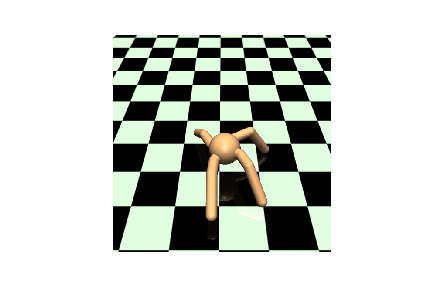
...
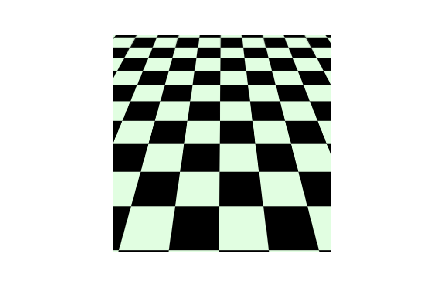
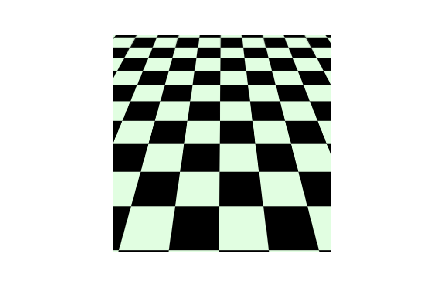
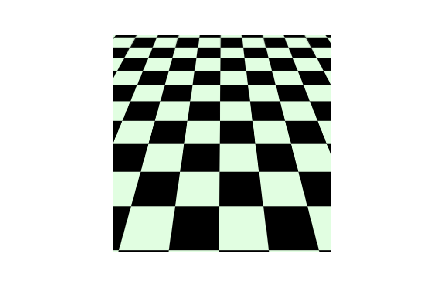
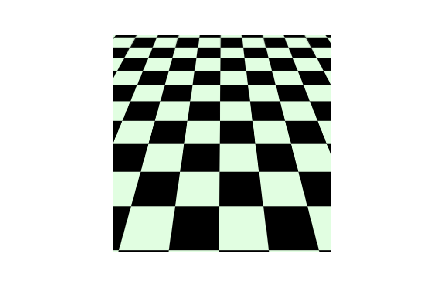
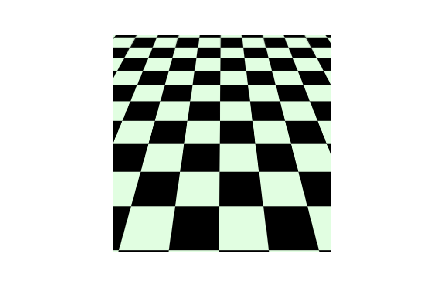

In [26]:
frames = []
total_reward = 0
state = env.reset()
value = []
r = []
for t in range(2000):
    prediction = agent.policy.act(state[np.newaxis,:])
    action  = prediction['a'].cpu().numpy()
    v = prediction['v'].detach().cpu().numpy()
    frames.append(env.render(mode='rgb_array')) 
    next_state, reward, done, _ = env.step(action[0])
    value.append(v.squeeze())
    r.append(reward)
    state=next_state
    total_reward+= reward
    if done:
        break

print ("Total reward:",total_reward)
env.close()
animate_frames(frames)

In [ ]:
r_ = compute_future_rewards(np.array(r)[np.newaxis,:],gamma=1.0)
plt.plot(r_[0])
plt.plot(value)

In [ ]:
agent.policy.std

In [ ]:
a = torch.zeros(3,dtype=torch.double,device=device)

In [ ]:
torch.any(a==0)